# Regression Predict Student Solution

© Explore Data Science Academy

---
### Honour Code

I {**YOUR NAME, YOUR SURNAME**}, confirm - by submitting this document - that the solutions in this notebook are a result of my own work and that I abide by the [EDSA honour code](https://drive.google.com/file/d/1QDCjGZJ8-FmJE3bZdIQNwnJyQKPhHZBn/view?usp=sharing).

Non-compliance with the honour code constitutes a material breach of contract.

### Predict Overview: Spain Electricity Shortfall Challenge

The government of Spain is considering an expansion of it's renewable energy resource infrastructure investments. As such, they require information on the trends and patterns of the countries renewable sources and fossil fuel energy generation. Your company has been awarded the contract to:

- 1. analyse the supplied data;
- 2. identify potential errors in the data and clean the existing data set;
- 3. determine if additional features can be added to enrich the data set;
- 4. build a model that is capable of forecasting the three hourly demand shortfalls;
- 5. evaluate the accuracy of the best machine learning model;
- 6. determine what features were most important in the model’s prediction decision, and
- 7. explain the inner working of the model to a non-technical audience.

Formally the problem statement was given to you, the senior data scientist, by your manager via email reads as follow:

> In this project you are tasked to model the shortfall between the energy generated by means of fossil fuels and various renewable sources - for the country of Spain. The daily shortfall, which will be referred to as the target variable, will be modelled as a function of various city-specific weather features such as `pressure`, `wind speed`, `humidity`, etc. As with all data science projects, the provided features are rarely adequate predictors of the target variable. As such, you are required to perform feature engineering to ensure that you will be able to accurately model Spain's three hourly shortfalls.
 
On top of this, she has provided you with a starter notebook containing vague explanations of what the main outcomes are. 

<a id="cont"></a>

## Table of Contents

<a href=#one>1. Importing Packages</a>

<a href=#two>2. Loading Data</a>

<a href=#three>3. Exploratory Data Analysis (EDA)</a>

<a href=#four>4. Data Engineering</a>

<a href=#five>5. Modeling</a>

<a href=#six>6. Model Performance</a>

<a href=#seven>7. Model Explanations</a>

 <a id="one"></a>
## 1. Importing Packages
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Importing Packages ⚡ |
| :--------------------------- |
| In this section you are required to import, and briefly discuss, the libraries that will be used throughout your analysis and modelling. |

---

In [1]:
# Libraries for data loading, data manipulation and data visulisation
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
from matplotlib import rc

# Libraries for data preparation and model building
import seaborn as sns
from scipy import stats
%matplotlib inline
from sklearn.linear_model import LinearRegression

# Setting global constants to ensure notebook results are reproducible
PARAMETER_CONSTANT = 0

import warnings
warnings.filterwarnings('ignore')

<a id="two"></a>
## 2. Loading the Data
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Loading the data ⚡ |
| :--------------------------- |
| In this section you are required to load the data from the `df_train` file into a DataFrame. |

---

In [3]:
#Load the train and test datasets
# train = pd.read_csv('/content/df_train.csv', index_col=[0])
# test = pd.read_csv('/content/df_test.csv', index_col=[0])

train = pd.read_csv('df_train.csv',index_col=[0])
test = pd.read_csv('df_test.csv',index_col=[0])

<a id="three"></a>
## 3. Exploratory Data Analysis (EDA)
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Exploratory data analysis ⚡ |
| :--------------------------- |
| In this section, you are required to perform an in-depth analysis of all the variables in the DataFrame. |

---


In [5]:
# check head of df_train
train.head(2)

,time,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,...,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h
0,2015-01-01 03:00:00,0.666667,level_5,0.0,0.666667,74.333333,64.000000,0.0,1.0,0.0,...,265.938000,281.013000,269.338615,269.338615,281.013000,269.338615,274.254667,265.938000,265.938000,6715.666667
1,2015-01-01 06:00:00,0.333333,level_10,0.0,1.666667,78.333333,64.666667,0.0,1.0,0.0,...,266.386667,280.561667,270.376000,270.376000,280.561667,270.376000,274.945000,266.386667,266.386667,4171.666667


In [6]:
# check head of df_test
test.head(2)

,time,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,...,Barcelona_temp_max,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min
8763,2018-01-01 00:00:00,5.000000,level_8,0.0,5.000000,87.0,71.333333,20.0,3.000000,0.0,...,287.816667,280.816667,287.356667,276.150000,280.38,286.816667,285.15,283.15,279.866667,279.15
8764,2018-01-01 03:00:00,4.666667,level_8,0.0,5.333333,89.0,78.000000,0.0,3.666667,0.0,...,284.816667,280.483333,284.190000,277.816667,281.01,283.483333,284.15,281.15,279.193333,278.15


### Info and shape of the datasets

In [8]:
#First, join the the train and test datasets together into one dataframe
df = pd.concat([train, test])

In [9]:
#Learn the shape of the dataframe
print('shape:', df.shape)


shape: (11683, 48)


In [10]:
#Learn the info of the dataframe
print('info:', df.info())


<class 'pandas.core.frame.DataFrame'>
Int64Index: 11683 entries, 0 to 11682
Data columns (total 48 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   time                  11683 non-null  object 
 1   Madrid_wind_speed     11683 non-null  float64
 2   Valencia_wind_deg     11683 non-null  object 
 3   Bilbao_rain_1h        11683 non-null  float64
 4   Valencia_wind_speed   11683 non-null  float64
 5   Seville_humidity      11683 non-null  float64
 6   Madrid_humidity       11683 non-null  float64
 7   Bilbao_clouds_all     11683 non-null  float64
 8   Bilbao_wind_speed     11683 non-null  float64
 9   Seville_clouds_all    11683 non-null  float64
 10  Bilbao_wind_deg       11683 non-null  float64
 11  Barcelona_wind_speed  11683 non-null  float64
 12  Barcelona_wind_deg    11683 non-null  float64
 13  Madrid_clouds_all     11683 non-null  float64
 14  Seville_wind_speed    11683 non-null  float64
 15  Barcelona_rain_1h  

### Look at data statistics


In [11]:
df.describe()

,Madrid_wind_speed,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,Bilbao_wind_deg,Barcelona_wind_speed,...,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h
count,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,...,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,8763.000000
mean,2.433750,0.118698,2.692873,63.774687,58.721818,43.440712,1.958629,14.155268,159.878855,2.782419,...,289.377372,289.869413,284.993657,286.447784,288.616766,288.095397,291.263219,288.282055,287.056222,10673.857612
std,1.831762,0.334918,2.321759,22.219380,24.390621,32.046215,1.696043,24.541321,101.005654,1.758587,...,9.594562,6.680538,6.730076,6.738466,6.391989,6.898601,8.136234,9.258559,9.093455,5218.046404
min,0.000000,0.000000,0.000000,8.333333,6.333333,0.000000,0.000000,0.000000,0.000000,0.000000,...,264.983333,270.816667,264.483333,267.483333,269.483333,269.063000,270.150000,264.983333,264.983333,-6618.000000
25%,1.000000,0.000000,1.000000,46.333333,38.000000,12.000000,1.000000,0.000000,76.666667,1.333333,...,282.150000,284.816667,280.122526,281.483448,284.150000,283.150000,285.483333,281.250000,280.150000,7390.333333
50%,2.000000,0.000000,2.000000,67.000000,59.333333,45.000000,1.333333,0.000000,145.666667,2.333333,...,287.843333,289.426667,284.816667,286.193333,288.276333,287.816667,290.382000,286.923333,285.816667,11114.666667
75%,3.333333,0.100000,3.666667,83.000000,80.000000,75.000000,2.666667,20.000000,233.333333,3.666667,...,296.483333,295.150000,289.816667,291.040000,293.483333,292.483333,296.641333,294.993167,293.708917,14498.166667
max,13.333333,3.000000,52.000000,100.000000,100.000000,100.000000,12.666667,97.333333,360.000000,12.666667,...,314.483333,308.150000,309.816667,310.710000,306.816667,317.966667,314.816667,313.133333,310.383333,31904.000000


Analyse portions of the data since the above is truncated

In [12]:
# Madrid
df_madrid = df.filter(['Unnamed: 0', 'time', 'Madrid_wind_speed', 
       'Madrid_humidity',  'Madrid_clouds_all','Madrid_rain_1h','Madrid_weather_id',
       'Madrid_pressure',  'Madrid_temp_max',
       'Madrid_temp', 'Madrid_temp_min', 'load_shortfall_3h'])

In [13]:
df_madrid.describe()

,Madrid_wind_speed,Madrid_humidity,Madrid_clouds_all,Madrid_rain_1h,Madrid_weather_id,Madrid_pressure,Madrid_temp_max,Madrid_temp,Madrid_temp_min,load_shortfall_3h
count,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,8763.000000
mean,2.433750,58.721818,20.668692,0.043328,769.851665,1011.797412,289.377372,288.282055,287.056222,10673.857612
std,1.831762,24.390621,28.478087,0.163996,81.914258,19.983122,9.594562,9.258559,9.093455,5218.046404
min,0.000000,6.333333,0.000000,0.000000,211.000000,927.666667,264.983333,264.983333,264.983333,-6618.000000
25%,1.000000,38.000000,0.000000,0.000000,800.000000,1012.666667,282.150000,281.250000,280.150000,7390.333333
50%,2.000000,59.333333,0.000000,0.000000,800.000000,1017.333333,287.843333,286.923333,285.816667,11114.666667
75%,3.333333,80.000000,38.333333,0.000000,800.666667,1021.666667,296.483333,294.993167,293.708917,14498.166667
max,13.333333,100.000000,100.000000,3.000000,804.000000,1038.000000,314.483333,313.133333,310.383333,31904.000000


In [14]:
# Bilbao
df_bilbao = df.filter(['Bilbao_rain_1h',  'Bilbao_clouds_all', 'Bilbao_wind_speed',
                             'Bilbao_wind_deg','Bilbao_snow_3h',  'Bilbao_pressure',
                             'Bilbao_weather_id','Bilbao_temp_min', 'Bilbao_temp','Bilbao_temp_max', 'load_shortfall_3h'])

In [14]:
df_bilbao.describe()

,Bilbao_rain_1h,Bilbao_clouds_all,Bilbao_wind_speed,Bilbao_wind_deg,Bilbao_snow_3h,Bilbao_pressure,Bilbao_weather_id,Bilbao_temp_min,Bilbao_temp,Bilbao_temp_max,load_shortfall_3h
count,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,8763.000000
mean,0.118698,43.440712,1.958629,159.878855,0.023936,1017.482011,727.800750,284.993657,286.447784,288.095397,10673.857612
std,0.334918,32.046215,1.696043,101.005654,0.482817,9.753552,113.616789,6.730076,6.738466,6.898601,5218.046404
min,0.000000,0.000000,0.000000,0.000000,0.000000,971.333333,207.333333,264.483333,267.483333,269.063000,-6618.000000
25%,0.000000,12.000000,1.000000,76.666667,0.000000,1013.333333,701.000000,280.122526,281.483448,283.150000,7390.333333
50%,0.000000,45.000000,1.333333,145.666667,0.000000,1018.666667,800.000000,284.816667,286.193333,287.816667,11114.666667
75%,0.100000,75.000000,2.666667,233.333333,0.000000,1023.333333,801.666667,289.816667,291.040000,292.483333,14498.166667
max,3.000000,100.000000,12.666667,360.000000,21.300000,1042.000000,804.000000,309.816667,310.710000,317.966667,31904.000000


In [15]:
# Valencia
df_valencia = df.filter(['Valencia_wind_deg','Valencia_wind_speed',
      'Valencia_snow_3h', 'Valencia_pressure', 'Valencia_temp_max', 'Valencia_temp', 'Valencia_humidity',
       'Valencia_temp_min', 'load_shortfall_3h'])

In [16]:
df_valencia.describe()

,Valencia_wind_speed,Valencia_snow_3h,Valencia_pressure,Valencia_temp_max,Valencia_temp,Valencia_humidity,Valencia_temp_min,load_shortfall_3h
count,11683.000000,11683.000000,9161.000000,11683.000000,11683.000000,11683.000000,11683.000000,8763.000000
mean,2.692873,0.000154,1012.346687,291.362722,290.788513,65.091814,290.229939,10673.857612
std,2.321759,0.010277,8.817473,7.441278,7.157835,19.040927,7.003619,5218.046404
min,0.000000,0.000000,972.666667,269.888000,269.888000,10.333333,269.888000,-6618.000000
25%,1.000000,0.000000,1010.666667,285.783333,285.395500,51.333333,284.928833,7390.333333
50%,2.000000,0.000000,1015.000000,291.150000,290.483333,66.333333,289.820000,11114.666667
75%,3.666667,0.000000,1018.000000,297.159167,296.437500,80.666667,295.491667,14498.166667
max,52.000000,0.791667,1021.666667,314.263333,310.426667,100.000000,310.272000,31904.000000


In [17]:
# Barcelona
df_barcelona = df.filter(['Barcelona_wind_speed','Barcelona_wind_deg', 
                                'Barcelona_rain_1h', 'Barcelona_pressure', 
                                'Barcelona_rain_3h', 'Barcelona_weather_id',
                                'Barcelona_temp_max','Barcelona_temp',
                                'Barcelona_temp_min', 'load_shortfall_3h']) 

In [18]:
df_barcelona.describe()

,Barcelona_wind_speed,Barcelona_wind_deg,Barcelona_rain_1h,Barcelona_pressure,Barcelona_rain_3h,Barcelona_weather_id,Barcelona_temp_max,Barcelona_temp,Barcelona_temp_min,load_shortfall_3h
count,11683.000000,11683.000000,11683.000000,1.168300e+04,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,8763.000000
mean,2.782419,187.654241,0.108534,1.287326e+03,0.000331,764.603446,291.042128,289.869413,288.616766,10673.857612
std,1.758587,88.694717,0.556794,1.218906e+04,0.003466,90.736191,7.236360,6.680538,6.391989,5218.046404
min,0.000000,0.000000,0.000000,6.706667e+02,0.000000,200.666667,272.150000,270.816667,269.483333,-6618.000000
25%,1.333333,116.666667,0.000000,1.013667e+03,0.000000,800.000000,285.338609,284.816667,284.150000,7390.333333
50%,2.333333,193.333333,0.000000,1.017333e+03,0.000000,800.000000,290.150000,289.426667,288.276333,11114.666667
75%,3.666667,260.000000,0.000000,1.021167e+03,0.000000,801.000000,296.816667,295.150000,293.483333,14498.166667
max,12.666667,360.000000,12.000000,1.001411e+06,0.093000,804.000000,314.076667,308.150000,306.816667,31904.000000


In [19]:
# Seville
df_seville = df.filter([ 'Seville_humidity','Seville_clouds_all',  
                              'Seville_wind_speed','Seville_pressure', 'Seville_rain_1h','Seville_rain_3h',
                              'Seville_weather_id', 'Seville_temp_max', 'Seville_temp',
                              'Seville_temp_min','load_shortfall_3h']) 

In [20]:
df_seville.describe()

,Seville_humidity,Seville_clouds_all,Seville_wind_speed,Seville_rain_1h,Seville_rain_3h,Seville_weather_id,Seville_temp_max,Seville_temp,Seville_temp_min,load_shortfall_3h
count,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,11683.000000,8763.000000
mean,63.774687,14.155268,2.483067,0.041120,0.000182,774.050843,296.007363,293.170948,291.263219,10673.857612
std,22.219380,24.541321,1.705508,0.180425,0.003171,72.909418,8.929160,7.998774,8.136234,5218.046404
min,8.333333,0.000000,0.000000,0.000000,0.000000,200.000000,272.063000,272.063000,270.150000,-6618.000000
25%,46.333333,0.000000,1.000000,0.000000,0.000000,800.000000,289.483333,287.403167,285.483333,7390.333333
50%,67.000000,0.000000,2.000000,0.000000,0.000000,800.000000,295.483333,292.470000,290.382000,11114.666667
75%,83.000000,20.000000,3.333333,0.000000,0.000000,800.000000,302.816667,298.806667,296.641333,14498.166667
max,100.000000,97.333333,12.666667,3.000000,0.093333,804.000000,320.483333,314.976667,314.816667,31904.000000


### Feature interactions of each city using Pairplot


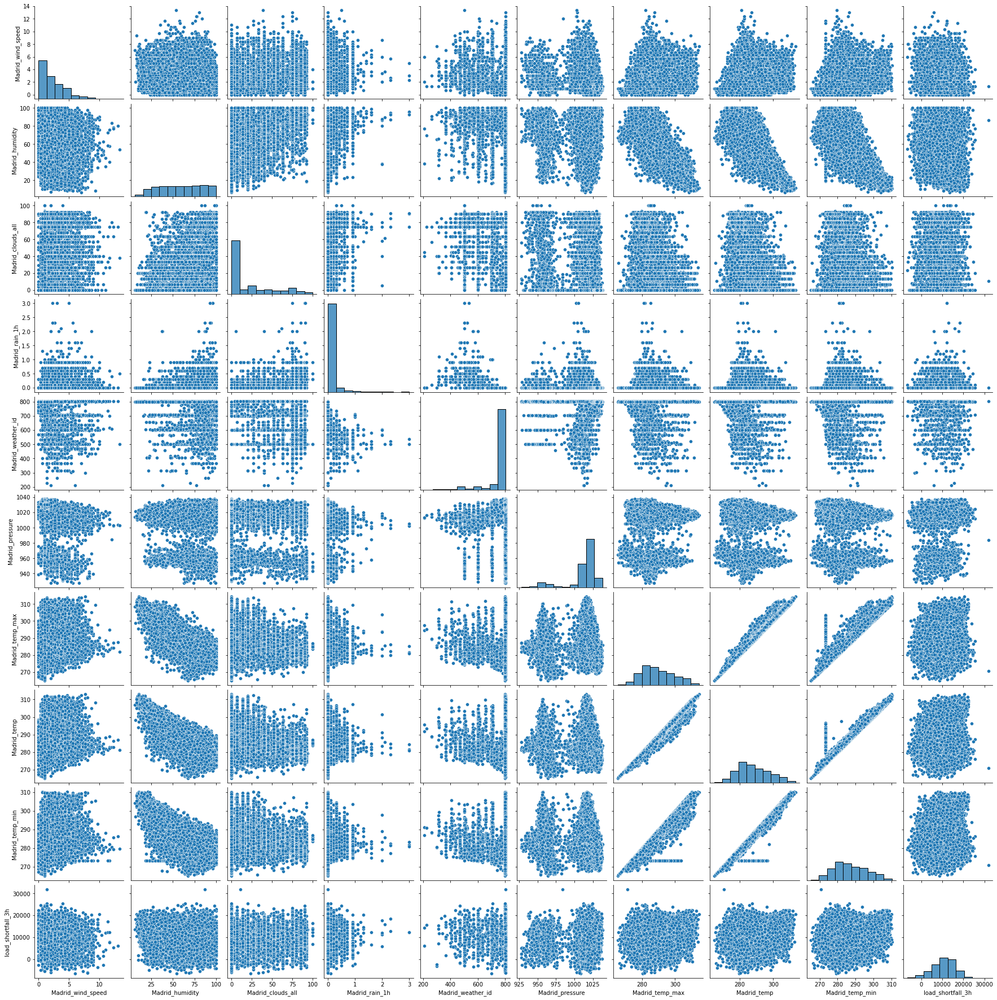

In [21]:
# Madrid
sns.pairplot(df_madrid, diag_kws={'bins': 10})

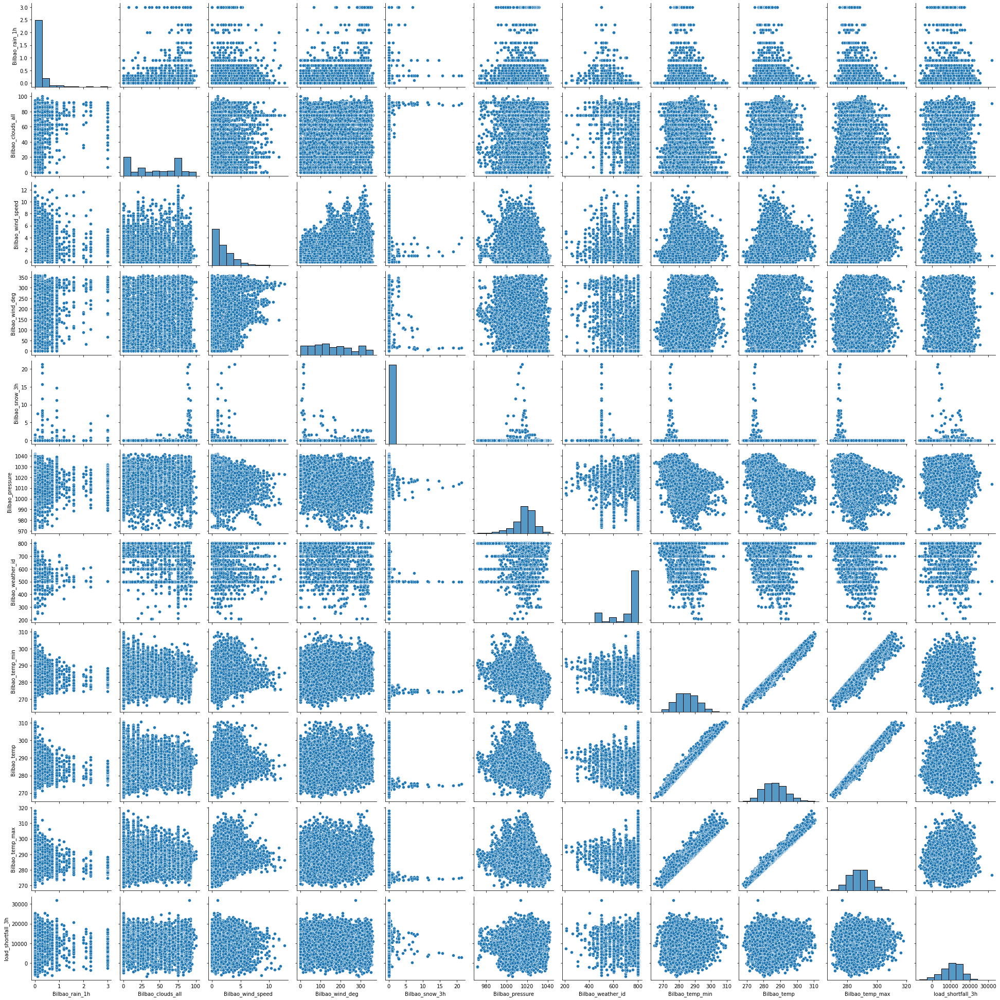

In [22]:
# Bilbao
sns.pairplot(df_bilbao, diag_kws={'bins': 10})

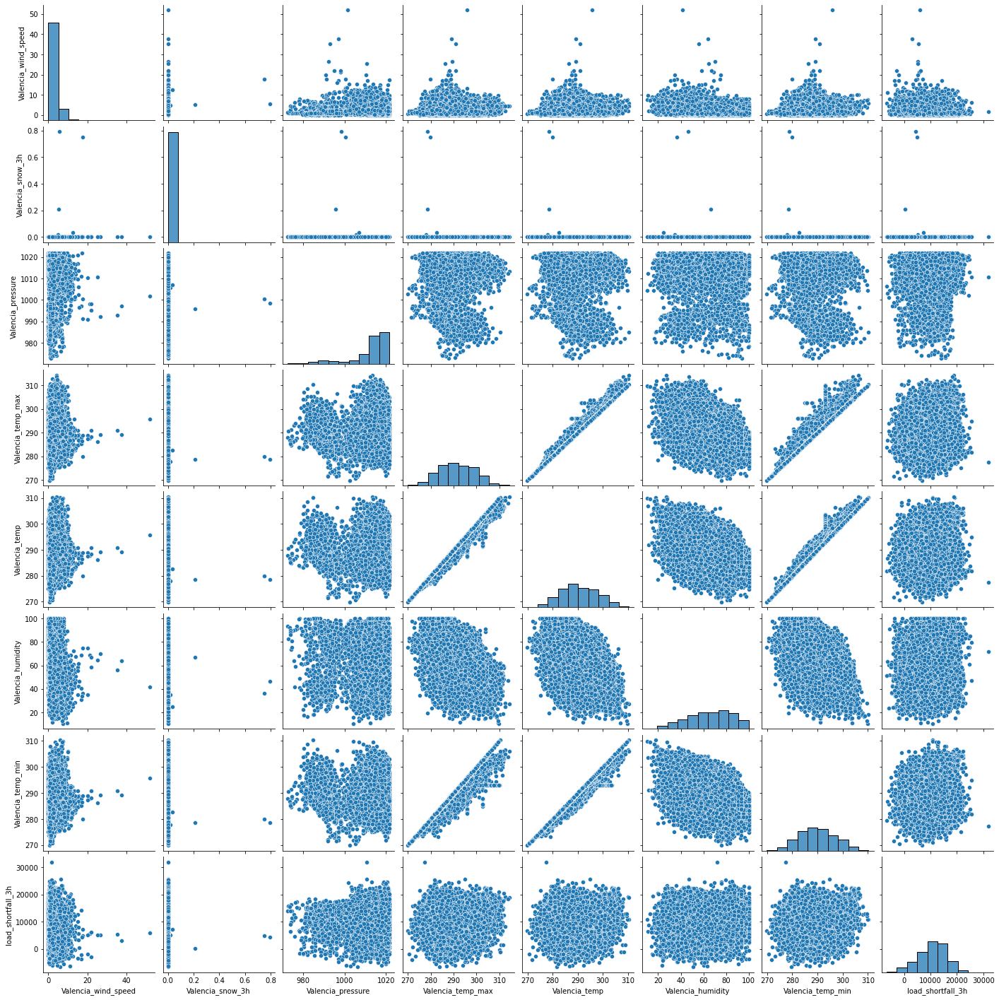

In [24]:
# Valencia
sns.pairplot(df_valencia, diag_kws={'bins': 10})

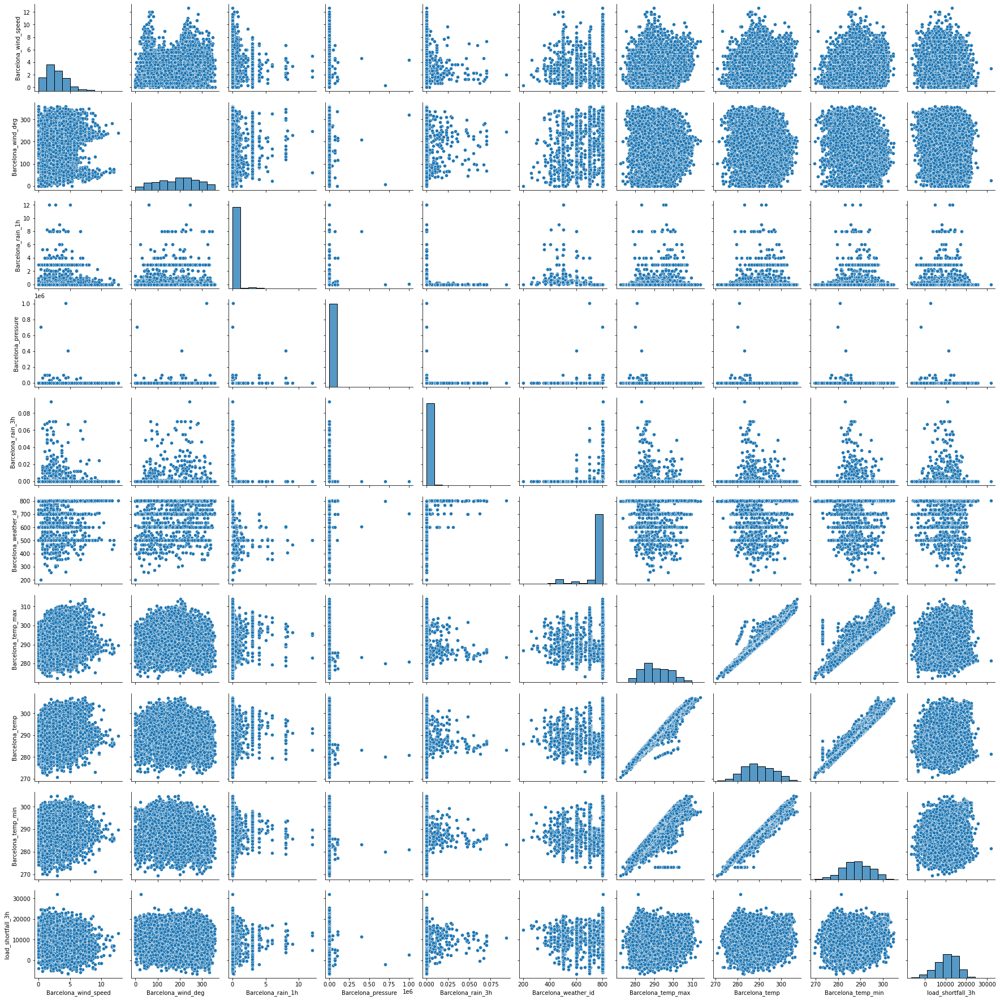

In [25]:
# Barcelona
sns.pairplot(df_barcelona, diag_kws={'bins': 10})

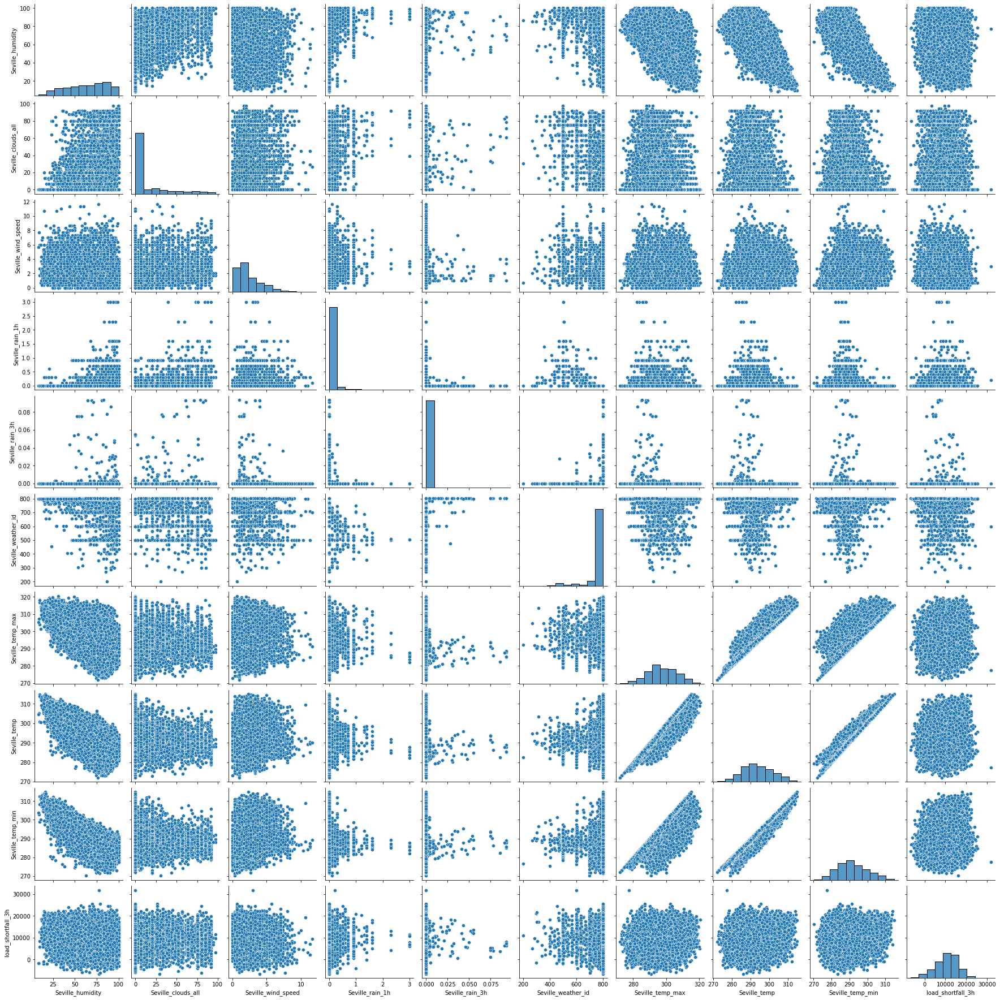

In [27]:
# Seville
sns.pairplot(df_seville, diag_kws={'bins': 10})

### Correlation evalution 


Evaluating correlation with the output variable

In [23]:
df.corrwith(df["load_shortfall_3h"]).sort_values(ascending=False)

load_shortfall_3h       1.000000
Valencia_temp_min       0.201863
Barcelona_temp_min      0.195984
Madrid_temp             0.186036
Barcelona_temp          0.182673
Madrid_temp_max         0.182548
Bilbao_temp_max         0.180934
Bilbao_temp             0.176411
Madrid_temp_min         0.174744
Seville_temp_min        0.174718
Valencia_temp           0.173225
Bilbao_temp_min         0.172920
Barcelona_temp_max      0.164734
Seville_temp            0.159343
Bilbao_weather_id       0.145875
Valencia_temp_max       0.144270
Seville_temp_max        0.109834
Madrid_pressure         0.092638
Valencia_pressure       0.086022
Barcelona_weather_id    0.063868
Seville_weather_id      0.061104
Valencia_humidity       0.043140
Bilbao_pressure         0.039052
Madrid_weather_id       0.030868
Valencia_snow_3h       -0.021633
Barcelona_rain_3h      -0.024720
Madrid_rain_1h         -0.027159
Seville_rain_1h        -0.031572
Bilbao_snow_3h         -0.031721
Seville_rain_3h        -0.032945
Barcelona_

Correlation for each city

<AxesSubplot:>

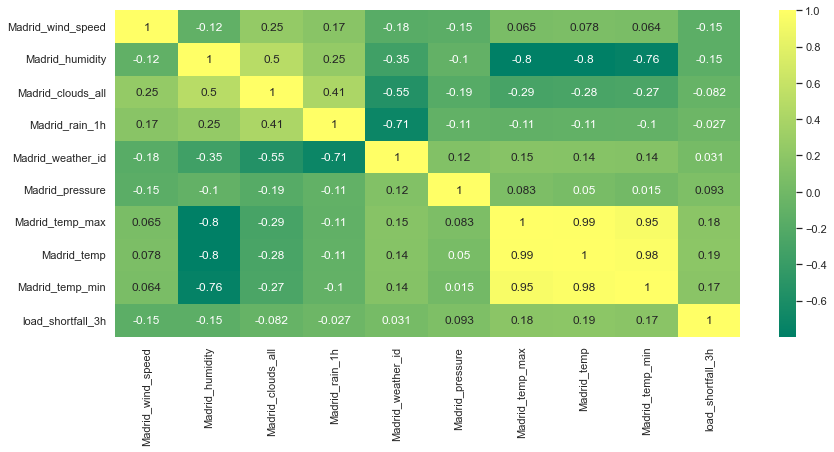

In [24]:
# Madrid
sns.set(rc = {'figure.figsize':(14,6)})
sns.heatmap(df_madrid.corr(), annot = True, fmt='.2g',cmap= 'summer')

<AxesSubplot:>

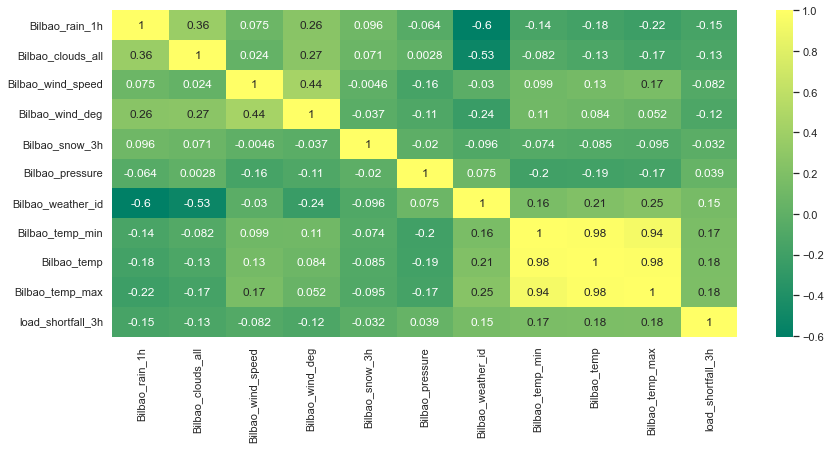

In [25]:
# Bilbao
sns.set(rc = {'figure.figsize':(14,6)})
sns.heatmap(df_bilbao.corr(), annot = True, fmt='.2g',cmap= 'summer')

<AxesSubplot:>

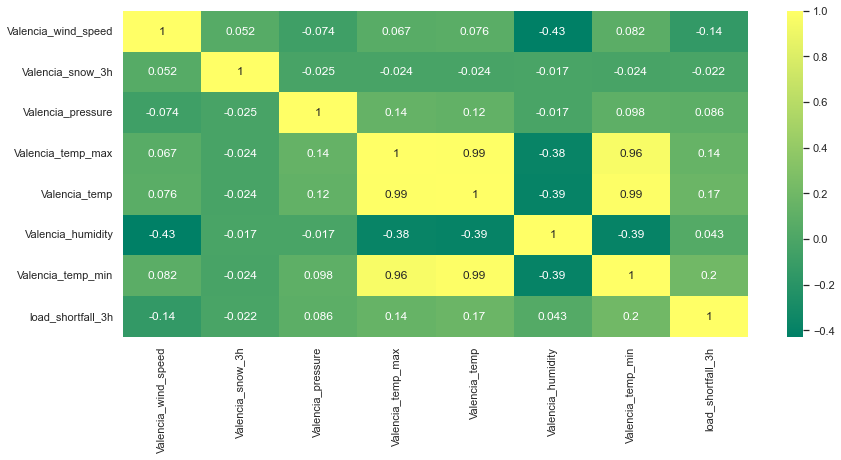

In [26]:
# Valencia
sns.set(rc = {'figure.figsize':(14,6)})
sns.heatmap(df_valencia.corr(), annot = True, fmt='.2g',cmap= 'summer')

<AxesSubplot:>

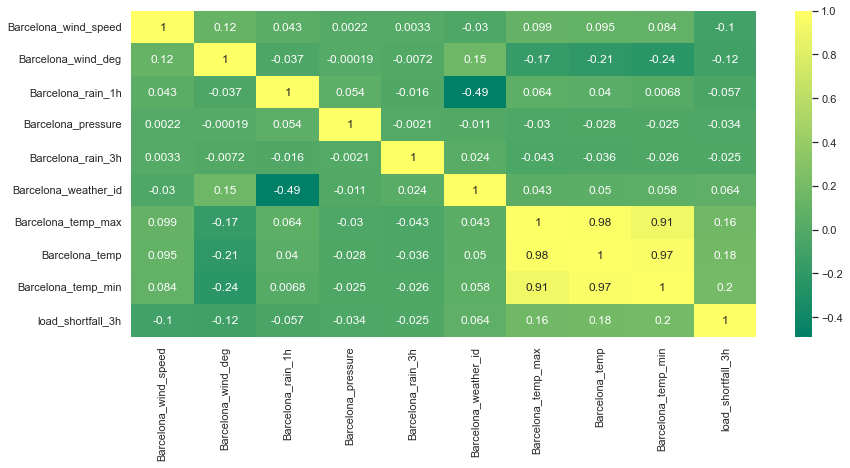

In [27]:
# Bacelona
sns.set(rc = {'figure.figsize':(14,6)})
sns.heatmap(df_barcelona.corr(), annot = True, fmt='.2g',cmap= 'summer')

<AxesSubplot:>

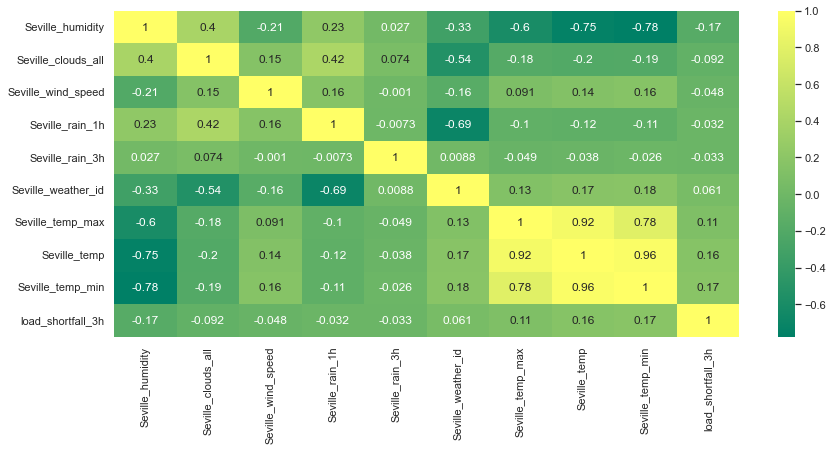

In [28]:
# Seville
sns.set(rc = {'figure.figsize':(14,6)})
sns.heatmap(df_seville.corr(), annot = True, fmt='.2g',cmap= 'summer')

### Feature distributions for each city and loadshort_fall

array([[<AxesSubplot:title={'center':'Madrid_wind_speed'}>,
        <AxesSubplot:title={'center':'Madrid_humidity'}>,
        <AxesSubplot:title={'center':'Madrid_clouds_all'}>],
       [<AxesSubplot:title={'center':'Madrid_rain_1h'}>,
        <AxesSubplot:title={'center':'Madrid_weather_id'}>,
        <AxesSubplot:title={'center':'Madrid_pressure'}>],
       [<AxesSubplot:title={'center':'Madrid_temp_max'}>,
        <AxesSubplot:title={'center':'Madrid_temp'}>,
        <AxesSubplot:title={'center':'Madrid_temp_min'}>],
       [<AxesSubplot:title={'center':'load_shortfall_3h'}>,
        <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

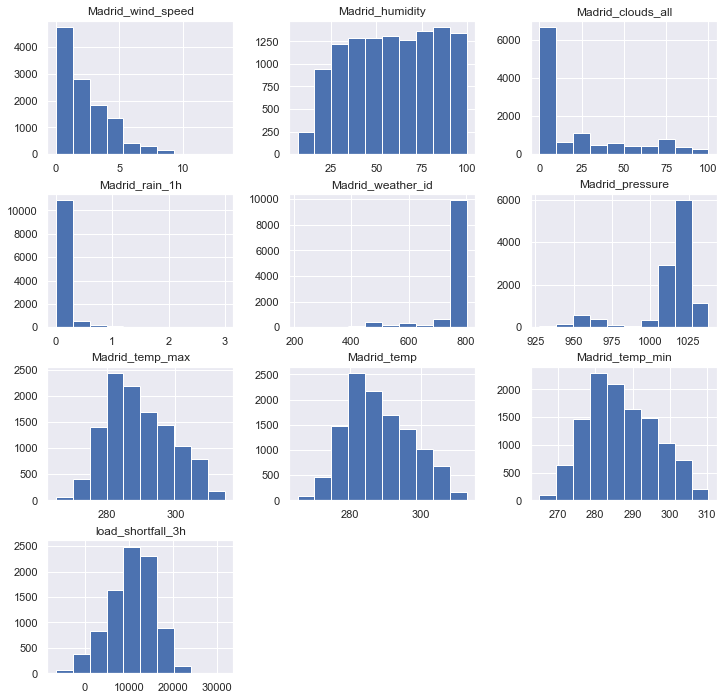

In [29]:
# Madrid
df_madrid.hist(layout = (4,3), figsize=(12, 12))

array([[<AxesSubplot:title={'center':'Bilbao_rain_1h'}>,
        <AxesSubplot:title={'center':'Bilbao_clouds_all'}>,
        <AxesSubplot:title={'center':'Bilbao_wind_speed'}>],
       [<AxesSubplot:title={'center':'Bilbao_wind_deg'}>,
        <AxesSubplot:title={'center':'Bilbao_snow_3h'}>,
        <AxesSubplot:title={'center':'Bilbao_pressure'}>],
       [<AxesSubplot:title={'center':'Bilbao_weather_id'}>,
        <AxesSubplot:title={'center':'Bilbao_temp_min'}>,
        <AxesSubplot:title={'center':'Bilbao_temp'}>],
       [<AxesSubplot:title={'center':'Bilbao_temp_max'}>,
        <AxesSubplot:title={'center':'load_shortfall_3h'}>,
        <AxesSubplot:>]], dtype=object)

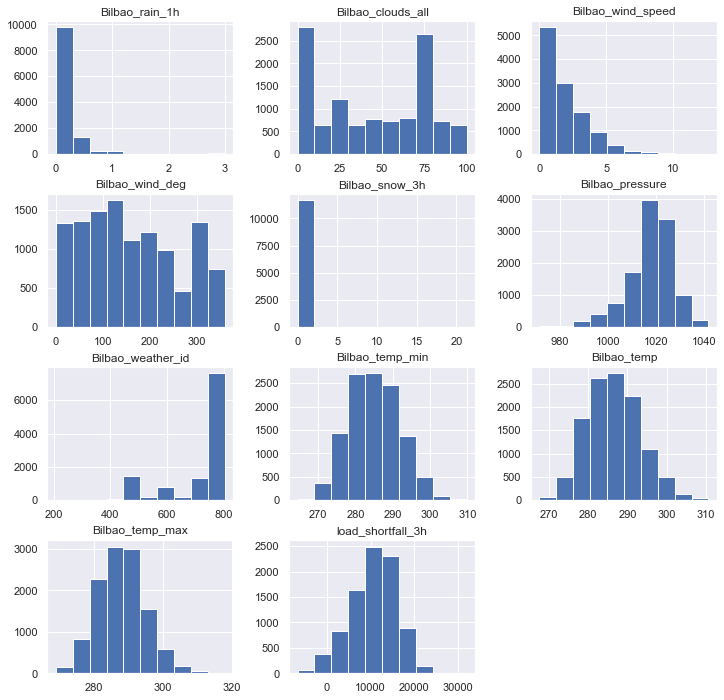

In [30]:
# Bilbao
df_bilbao.hist(layout = (4,3), figsize=(12, 12))

array([[<AxesSubplot:title={'center':'Valencia_wind_speed'}>,
        <AxesSubplot:title={'center':'Valencia_snow_3h'}>,
        <AxesSubplot:title={'center':'Valencia_pressure'}>],
       [<AxesSubplot:title={'center':'Valencia_temp_max'}>,
        <AxesSubplot:title={'center':'Valencia_temp'}>,
        <AxesSubplot:title={'center':'Valencia_humidity'}>],
       [<AxesSubplot:title={'center':'Valencia_temp_min'}>,
        <AxesSubplot:title={'center':'load_shortfall_3h'}>,
        <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

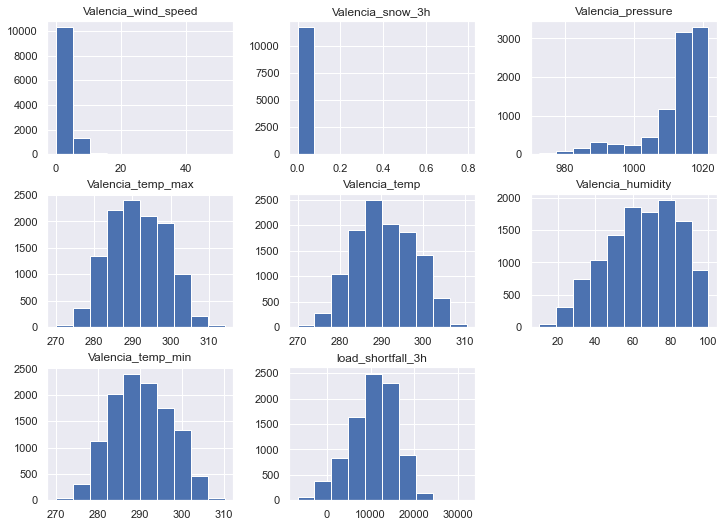

In [31]:
# Valencia
df_valencia.hist(layout = (4,3), figsize=(12, 12))

array([[<AxesSubplot:title={'center':'Barcelona_wind_speed'}>,
        <AxesSubplot:title={'center':'Barcelona_wind_deg'}>,
        <AxesSubplot:title={'center':'Barcelona_rain_1h'}>],
       [<AxesSubplot:title={'center':'Barcelona_pressure'}>,
        <AxesSubplot:title={'center':'Barcelona_rain_3h'}>,
        <AxesSubplot:title={'center':'Barcelona_weather_id'}>],
       [<AxesSubplot:title={'center':'Barcelona_temp_max'}>,
        <AxesSubplot:title={'center':'Barcelona_temp'}>,
        <AxesSubplot:title={'center':'Barcelona_temp_min'}>],
       [<AxesSubplot:title={'center':'load_shortfall_3h'}>,
        <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

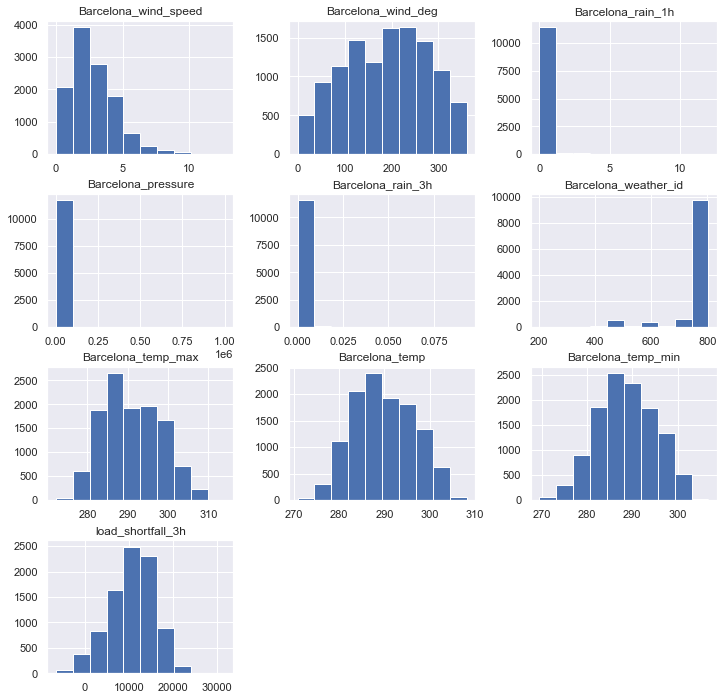

In [32]:
# Barcelona
df_barcelona.hist(layout = (4,3), figsize=(12, 12))

array([[<AxesSubplot:title={'center':'Seville_humidity'}>,
        <AxesSubplot:title={'center':'Seville_clouds_all'}>,
        <AxesSubplot:title={'center':'Seville_wind_speed'}>],
       [<AxesSubplot:title={'center':'Seville_rain_1h'}>,
        <AxesSubplot:title={'center':'Seville_rain_3h'}>,
        <AxesSubplot:title={'center':'Seville_weather_id'}>],
       [<AxesSubplot:title={'center':'Seville_temp_max'}>,
        <AxesSubplot:title={'center':'Seville_temp'}>,
        <AxesSubplot:title={'center':'Seville_temp_min'}>],
       [<AxesSubplot:title={'center':'load_shortfall_3h'}>,
        <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

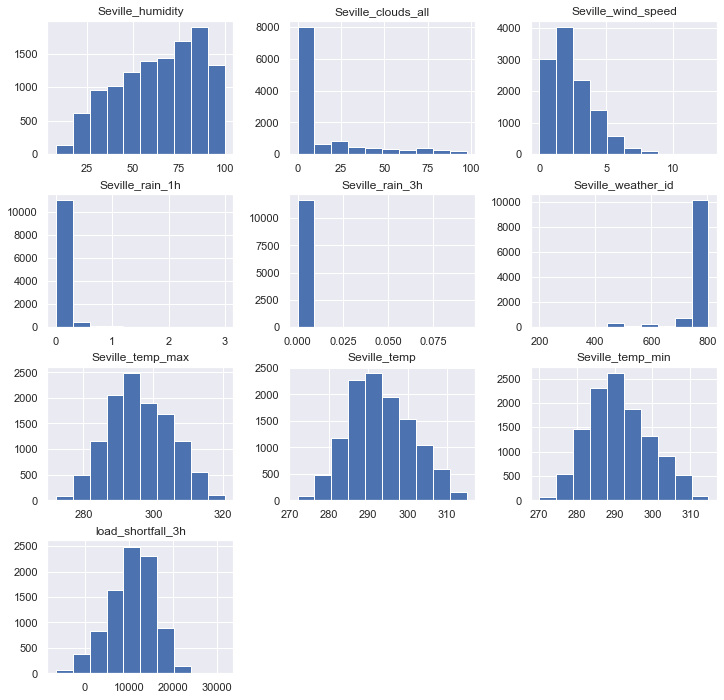

In [34]:
# Seville
df_seville.hist(layout = (4,3), figsize=(12, 12))

#### Checking for outliers

In [35]:
# Analyse the skew and look for outliers

df_skew = pd.DataFrame(df.skew(), columns=['skew'])
df_kurtosis = pd.DataFrame(df.kurtosis(), columns=['kurtosis'])

df_skewkurt = pd.concat([df_skew, df_kurtosis], axis=1).sort_values('kurtosis', ascending = False)

df_skewkurt

,skew,kurtosis
Valencia_snow_3h,73.090853,5452.830025
Barcelona_pressure,66.949053,4916.988101
Bilbao_snow_3h,30.237039,1075.823322
Seville_rain_3h,22.349167,552.067395
Barcelona_rain_3h,14.668923,251.188884
Barcelona_rain_1h,9.833191,130.956428
Seville_rain_1h,7.535944,79.440881
Madrid_rain_1h,6.446514,63.372354
Bilbao_rain_1h,5.694539,40.584429
Valencia_wind_speed,3.116352,31.014311


Valencia_snow_3h            AxesSubplot(0.125,0.71587;0.168478x0.16413)
Barcelona_pressure       AxesSubplot(0.327174,0.71587;0.168478x0.16413)
Bilbao_snow_3h           AxesSubplot(0.529348,0.71587;0.168478x0.16413)
Seville_rain_3h          AxesSubplot(0.731522,0.71587;0.168478x0.16413)
Barcelona_rain_3h          AxesSubplot(0.125,0.518913;0.168478x0.16413)
Barcelona_rain_1h       AxesSubplot(0.327174,0.518913;0.168478x0.16413)
Seville_rain_1h         AxesSubplot(0.529348,0.518913;0.168478x0.16413)
Madrid_rain_1h          AxesSubplot(0.731522,0.518913;0.168478x0.16413)
Bilbao_rain_1h             AxesSubplot(0.125,0.321957;0.168478x0.16413)
Valencia_wind_speed     AxesSubplot(0.327174,0.321957;0.168478x0.16413)
Seville_weather_id      AxesSubplot(0.529348,0.321957;0.168478x0.16413)
Madrid_weather_id       AxesSubplot(0.731522,0.321957;0.168478x0.16413)
Barcelona_weather_id          AxesSubplot(0.125,0.125;0.168478x0.16413)
Madrid_pressure            AxesSubplot(0.327174,0.125;0.168478x0

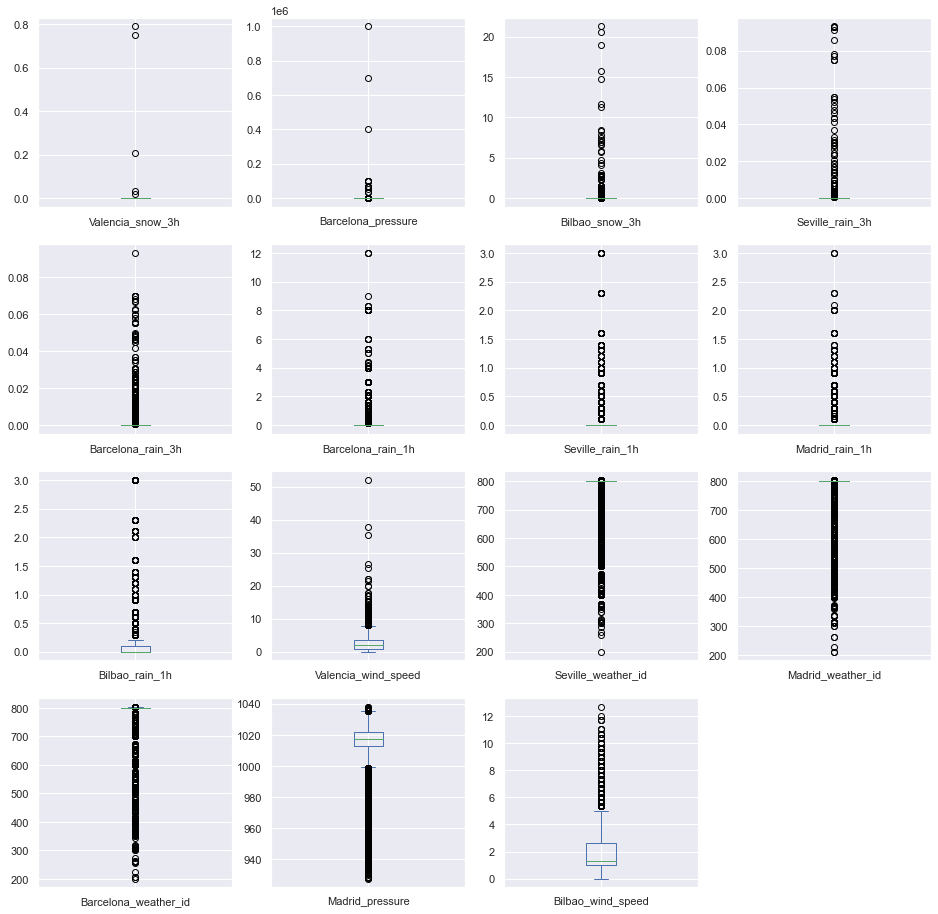

In [36]:
# create list of all the features with high kurtosis(>3) and check for outliers

outlier_list = df_skewkurt.loc[df_skewkurt['kurtosis']>3].index.tolist()

df[outlier_list].plot(kind='box', subplots=True, layout=(4, 4), sharex=False, figsize=(16, 16))

<a id="four"></a>
## 4. Data Engineering
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Data engineering ⚡ |
| :--------------------------- |
| In this section you are required to: clean the dataset, and possibly create new features - as identified in the EDA phase. |

---

In [37]:
#First, check for any null or missing values in the dataframe
df.isnull().sum()

time                       0
Madrid_wind_speed          0
Valencia_wind_deg          0
Bilbao_rain_1h             0
Valencia_wind_speed        0
Seville_humidity           0
Madrid_humidity            0
Bilbao_clouds_all          0
Bilbao_wind_speed          0
Seville_clouds_all         0
Bilbao_wind_deg            0
Barcelona_wind_speed       0
Barcelona_wind_deg         0
Madrid_clouds_all          0
Seville_wind_speed         0
Barcelona_rain_1h          0
Seville_pressure           0
Seville_rain_1h            0
Bilbao_snow_3h             0
Barcelona_pressure         0
Seville_rain_3h            0
Madrid_rain_1h             0
Barcelona_rain_3h          0
Valencia_snow_3h           0
Madrid_weather_id          0
Barcelona_weather_id       0
Bilbao_pressure            0
Seville_weather_id         0
Valencia_pressure       2522
Seville_temp_max           0
Madrid_pressure            0
Valencia_temp_max          0
Valencia_temp              0
Bilbao_weather_id          0
Seville_temp  

From the results above, we can see that the 'Valencia_Pressure' column has 2522 missing values, and load_shortfall column has 2920 missing values. However, it is acceptable for the load_shortfall_3h column to have these null values since the test dataset does not contain the predictor variables (y)

In [38]:
# Print out the mean, median, and mode values of the valencia_pressure column to see how they vary from each other

print('Mean: ', df['Valencia_pressure'].mean())
print('Median: ', df['Valencia_pressure'].median())
print('Mode: ', df['Valencia_pressure'].mode()[0])


Mean:  1012.3466870428985
Median:  1015.0
Mode:  1018.0


In [39]:
#Now, impute the missing values using the mode
df1 = df
df1['Valencia_pressure'] = df1['Valencia_pressure'].fillna(df1['Valencia_pressure'].mode()[0])
df1['Valencia_pressure']

0        1002.666667
1        1004.333333
2        1005.333333
3        1009.000000
4        1018.000000
            ...     
11678    1018.000000
11679    1018.000000
11680    1018.000000
11681    1018.000000
11682    1018.000000
Name: Valencia_pressure, Length: 11683, dtype: float64

In [40]:
#Check and confirm if the missing values from the valencia_pressure column have truly been removed
df1.isnull().sum()

time                       0
Madrid_wind_speed          0
Valencia_wind_deg          0
Bilbao_rain_1h             0
Valencia_wind_speed        0
Seville_humidity           0
Madrid_humidity            0
Bilbao_clouds_all          0
Bilbao_wind_speed          0
Seville_clouds_all         0
Bilbao_wind_deg            0
Barcelona_wind_speed       0
Barcelona_wind_deg         0
Madrid_clouds_all          0
Seville_wind_speed         0
Barcelona_rain_1h          0
Seville_pressure           0
Seville_rain_1h            0
Bilbao_snow_3h             0
Barcelona_pressure         0
Seville_rain_3h            0
Madrid_rain_1h             0
Barcelona_rain_3h          0
Valencia_snow_3h           0
Madrid_weather_id          0
Barcelona_weather_id       0
Bilbao_pressure            0
Seville_weather_id         0
Valencia_pressure          0
Seville_temp_max           0
Madrid_pressure            0
Valencia_temp_max          0
Valencia_temp              0
Bilbao_weather_id          0
Seville_temp  

In [41]:
# create new features
#Convert the datatype the time column 
df2 = df1
df2['time'] = pd.to_datetime(df2['time'])
df2['time']


0       2015-01-01 03:00:00
1       2015-01-01 06:00:00
2       2015-01-01 09:00:00
3       2015-01-01 12:00:00
4       2015-01-01 15:00:00
                ...        
11678   2018-12-31 09:00:00
11679   2018-12-31 12:00:00
11680   2018-12-31 15:00:00
11681   2018-12-31 18:00:00
11682   2018-12-31 21:00:00
Name: time, Length: 11683, dtype: datetime64[ns]

In [42]:
columsn_list =[]
df2['Day'] = df2['time'].dt.day
# month
df2['Month'] = df2['time'].dt.month
# year
df2['Year'] = df2['time'].dt.year
# hour
df2['hour'] = df2['time'].dt.hour
# minute
df2['minute'] = df2['time'].dt.minute
# second
df2['second'] = df2['time'].dt.second

df3 = df2;

columsn_list = ['time','Day','Month','Year','hour','minute','second'] + list(df2.columns[1:-6])

df3 = df2[columsn_list]

df3.head()

,time,Day,Month,Year,hour,minute,second,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,...,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h
0,2015-01-01 03:00:00,1,1,2015,3,0,0,0.666667,level_5,0.0,...,265.938000,281.013000,269.338615,269.338615,281.013000,269.338615,274.254667,265.938000,265.938000,6715.666667
1,2015-01-01 06:00:00,1,1,2015,6,0,0,0.333333,level_10,0.0,...,266.386667,280.561667,270.376000,270.376000,280.561667,270.376000,274.945000,266.386667,266.386667,4171.666667
2,2015-01-01 09:00:00,1,1,2015,9,0,0,1.000000,level_9,0.0,...,272.708667,281.583667,275.027229,275.027229,281.583667,275.027229,278.792000,272.708667,272.708667,4274.666667
3,2015-01-01 12:00:00,1,1,2015,12,0,0,1.000000,level_8,0.0,...,281.895219,283.434104,281.135063,281.135063,283.434104,281.135063,285.394000,281.895219,281.895219,5075.666667
4,2015-01-01 15:00:00,1,1,2015,15,0,0,1.000000,level_7,0.0,...,280.678437,284.213167,282.252063,282.252063,284.213167,282.252063,285.513719,280.678437,280.678437,6620.666667


In [43]:
# Engineer existing features


#Transform the valencia_wind_deg column 
import string
# df3 = df2
df3['Valencia_wind_deg'] = df3['Valencia_wind_deg'].str.extract('(\d+)') #extract the numbers from the string
df3['Valencia_wind_deg'] = pd.to_numeric(df3['Valencia_wind_deg']) #next, transform from object datatype to numeric

#Transform the Seville_pressure column 
df4 = df3
df4['Seville_pressure'] = df3['Seville_pressure'].str.extract('(\d+)') #extract the numbers from the string
df3['Seville_pressure'] = pd.to_numeric(df3['Seville_pressure']) #next, transform from object datatype to numeric

#Finally, check the datatypes of the dataframe to ensure the three columns are now numeric
df4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11683 entries, 0 to 11682
Data columns (total 54 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   time                  11683 non-null  datetime64[ns]
 1   Day                   11683 non-null  int64         
 2   Month                 11683 non-null  int64         
 3   Year                  11683 non-null  int64         
 4   hour                  11683 non-null  int64         
 5   minute                11683 non-null  int64         
 6   second                11683 non-null  int64         
 7   Madrid_wind_speed     11683 non-null  float64       
 8   Valencia_wind_deg     11683 non-null  int64         
 9   Bilbao_rain_1h        11683 non-null  float64       
 10  Valencia_wind_speed   11683 non-null  float64       
 11  Seville_humidity      11683 non-null  float64       
 12  Madrid_humidity       11683 non-null  float64       
 13  Bilbao_clouds_al

In [44]:
df_clean = df4.drop(['time'], axis=1)
#  axis=1 means drop along the column
#   axis=0 means drop along the row

<a id="five"></a>
## 5. Modelling
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Modelling ⚡ |
| :--------------------------- |
| In this section, you are required to create one or more regression models that are able to accurately predict the thee hour load shortfall. |

---

In [45]:
# Split the dataset into the response, y, and features, X

y = df_clean[:len(train)][['load_shortfall_3h']]
x = df_clean[:len(train)].drop('load_shortfall_3h',axis=1)


x_train = df_clean[:len(train)].drop('load_shortfall_3h',axis=1)
x_test = df_clean[len(train):].drop('load_shortfall_3h',axis=1)

In [47]:
# create targets and features dataset
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2,random_state=50)


#### Linear Regression Model

In [48]:
# create one or more ML models
# Declare the model object
lm = LinearRegression()
lm.fit(x_train, y_train)

LinearRegression()

In [49]:
# Extract the intercept, or y-cut, of our linear model
a = float(lm.intercept_)

# Extract the coefficient, or gradient, of our linear model
b = lm.coef_

# Generate the values that fall along our regression line
preds = lm.predict(x_test)

In [50]:
print("Slope:\t\t", b)
print("Intercept:\t", float(a))

Slope:		 [[ 5.89434886e+01  1.49625956e+02  2.10587073e+02  8.45044188e+01
   9.62493374e-09  1.20271246e-08 -1.86081012e+02 -9.33118307e+01
  -5.25069546e+02 -7.04356057e+01 -3.30478960e+01 -2.67844080e+00
  -4.99491558e+00 -7.48037103e+01  2.72489631e+00 -2.13452262e+00
  -8.52535173e+01 -2.12362835e+00  6.12046784e+00 -4.65367990e+01
  -2.18110315e+02  3.73383408e+01  4.18036321e+02  1.35186540e+02
  -6.91665322e-03 -2.24067854e+04  8.96271508e+02 -1.77408978e+04
  -3.90646209e+03 -2.02418098e-01  8.31089761e-01 -2.00845115e+01
   1.84089092e-01  5.96675938e+01 -9.21999598e+01 -2.70531836e+00
  -1.44700165e+02 -2.80525717e+02  1.05518459e+00  2.31560542e+02
   1.46104334e+01  4.54540710e+02 -2.26264545e+02 -2.65772016e+02
   6.36176061e+02  6.37465320e+02 -1.13731490e+03 -2.56588335e+02
   4.84561493e+02 -2.81971259e+02  5.52987868e+02 -2.32920374e+02]]
Intercept:	 -474168.3880048535


#### Random Forest Regression

In [51]:
# evaluate one or more ML models
# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor
 
 # create regressor object
Rfr = RandomForestRegressor(n_estimators = 100, random_state = 0)
 
# fit the regressor with x and y data
# Rfr.fit(x, y) 
Rfr.fit(x_train, y_train) 

RandomForestRegressor(random_state=0)

In [52]:
preds_Rfr = Rfr.predict(x_test)  # test the output by changing values

In [53]:
preds_Rfr

array([13966.065     , 13559.72666667, 10208.38333333, ...,
       10190.03      ,  9478.94      ,  4871.84666667])

<a id="six"></a>
## 6. Model Performance
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model performance ⚡ |
| :--------------------------- |
| In this section you are required to compare the relative performance of the various trained ML models on a holdout dataset and comment on what model is the best and why. |

---

In [54]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [55]:
# Compare model performance
rmse = np.sqrt(mean_squared_error(y_test,preds))
r2 = r2_score(y_test,preds)

In [56]:
print("Linear Regression Model\t")
print("Root Mean Square Error :\t", rmse)
print("R-Square Score:\t", r2)

Linear Regression Model	
Root Mean Square Error :	 4770.968664846621
R-Square Score:	 0.20129262469210085


In [57]:
# Compare model performance
rmse_Rfr = np.sqrt(mean_squared_error(y_test,preds_Rfr))
r2_Rfr = r2_score(y_test,preds_Rfr)

In [58]:
print("Random Forest Regrassion Model\t")
print("Root Mean Square Error :\t", rmse_Rfr)
print("R-Square Score:\t", r2_Rfr)

Random Forest Regrassion Model	
Root Mean Square Error :	 3082.391977960251
R-Square Score:	 0.6666117434924879


In [59]:
# dictionary of results
results_dict = {
                'Test R-Square Score':
                    {
                        "Linear Regression Model": r2,
                        "Random Forest Regrassion Mode":r2_Rfr
                    },
                'Test RMSE':
                    {
                        "Linear Regression Model":rmse,
                        "Random Forest Regrassion Mode": rmse_Rfr
                    }
                }# create dataframe from dictionary
results_df = pd.DataFrame(data=results_dict)
results_df

,Test R-Square Score,Test RMSE
Linear Regression Model,0.201293,4770.968665
Random Forest Regrassion Mode,0.666612,3082.391978


<a id="seven"></a>
## 7. Model Explanations
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model explanation ⚡ |
| :--------------------------- |
| In this section, you are required to discuss how the best performing model works in a simple way so that both technical and non-technical stakeholders can grasp the intuition behind the model's inner workings. |

---

In [ ]:
# discuss chosen methods logic